# Movie Recommendation System

## About Dataset:
Contains metadata for more than 700,000 movies listed in the TMDB Dataset.

## Problem Statement:
Build  a  movie  recommendation  system  based  on  ‘TMDB’  dataset using Content Based Filtering. 

## Content-Based Filtering

* Content-based filtering uses item features to recommend other items similar to what the user likes, based on their previous actions or explicit feedback.For example, if user A watched two horror movies, another horror movie will be proposed to him.

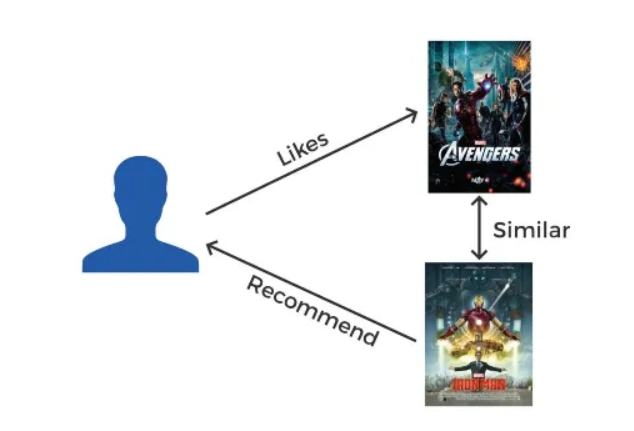

# Importing Libraries

In [1]:
import sklearn as sk
import numpy as np # linear algebra
import pandas as pd # data processing
# Visualisation libraries
import matplotlib.pyplot as plt
import seaborn as sns

# FETCHING DATASET

In [2]:
data=pd.read_csv(r"movies.csv")
data.head(5)

,id,title,genres,original_language,overview,popularity,production_companies,release_date,budget,revenue,runtime,status,tagline,vote_average,vote_count,credits,keywords,poster_path,backdrop_path,recommendations
0,758323,The Pope's Exorcist,Horror-Mystery-Thriller,en,Father Gabriele Amorth Chief Exorcist of the V...,5953.227,Screen Gems-2.0 Entertainment-Jesus & Mary-Wor...,2023-04-05,18000000.0,65675816.0,103.0,Released,Inspired by the actual files of Father Gabriel...,7.433,545.0,Russell Crowe-Daniel Zovatto-Alex Essoe-Franco...,spain-rome italy-vatican-pope-pig-possession-c...,/9JBEPLTPSm0d1mbEcLxULjJq9Eh.jpg,/hiHGRbyTcbZoLsYYkO4QiCLYe34.jpg,713704-296271-502356-1076605-1084225-1008005-9...
1,667538,Transformers: Rise of the Beasts,Action-Adventure-Science Fiction,en,When a new threat capable of destroying the en...,5409.104,Skydance-Paramount-di Bonaventura Pictures-Bay...,2023-06-06,200000000.0,407045464.0,127.0,Released,Unite or fall.,7.340,1007.0,Anthony Ramos-Dominique Fishback-Luna Lauren V...,peru-alien-end of the world-based on cartoon-b...,/gPbM0MK8CP8A174rmUwGsADNYKD.jpg,/woJbg7ZqidhpvqFGGMRhWQNoxwa.jpg,496450-569094-298618-385687-877100-598331-4628...
2,640146,Ant-Man and the Wasp: Quantumania,Action-Adventure-Science Fiction,en,Super-Hero partners Scott Lang and Hope van Dy...,4425.387,Marvel Studios-Kevin Feige Productions,2023-02-15,200000000.0,475766228.0,125.0,Released,Witness the beginning of a new dynasty.,6.507,2811.0,Paul Rudd-Evangeline Lilly-Jonathan Majors-Kat...,hero-ant-sequel-superhero-based on comic-famil...,/qnqGbB22YJ7dSs4o6M7exTpNxPz.jpg,/m8JTwHFwX7I7JY5fPe4SjqejWag.jpg,823999-676841-868759-734048-267805-965839-1033...
3,677179,Creed III,Drama-Action,en,After dominating the boxing world Adonis Creed...,3994.342,Metro-Goldwyn-Mayer-Proximity Media-Balboa Pro...,2023-03-01,75000000.0,269000000.0,116.0,Released,You can't run from your past.,7.262,1129.0,Michael B. Jordan-Tessa Thompson-Jonathan Majo...,philadelphia pennsylvania-husband wife relatio...,/cvsXj3I9Q2iyyIo95AecSd1tad7.jpg,/5i6SjyDbDWqyun8klUuCxrlFbyw.jpg,965839-267805-943822-842942-1035806-823999-107...
4,614479,Insidious: The Red Door,Horror-Mystery-Thriller,en,To put their demons to rest once and for all J...,3512.648,Blumhouse Productions-Stage 6 Films-Screen Gem...,2023-07-05,16000000.0,175582093.0,107.0,Released,It ends where it all began.,6.750,564.0,Ty Simpkins-Patrick Wilson-Sinclair Daniel-Ros...,sequel-demon-franchise-insidious-supernatural ...,/azTC5osYiqei1ofw6Z3GmUrxQbi.jpg,/i2GVEvltEu3BXn5crBSxgKuTaca.jpg,681435-644937-448085-980848-1101547-988355-561...


In [3]:
#shape of dataset
data.shape

(722725, 20)

In [4]:
#size of dataset
data.size

14454500

In [5]:
# check columns of data and its data-types present in dataframe
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 722725 entries, 0 to 722724
Data columns (total 20 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    722725 non-null  int64  
 1   title                 722721 non-null  object 
 2   genres                511967 non-null  object 
 3   original_language     722725 non-null  object 
 4   overview              604180 non-null  object 
 5   popularity            722725 non-null  float64
 6   production_companies  337194 non-null  object 
 7   release_date          670428 non-null  object 
 8   budget                722725 non-null  float64
 9   revenue               722725 non-null  float64
 10  runtime               688289 non-null  float64
 11  status                722725 non-null  object 
 12  tagline               108153 non-null  object 
 13  vote_average          722725 non-null  float64
 14  vote_count            722725 non-null  float64
 15  

In [6]:
data.describe()

,id,popularity,budget,revenue,runtime,vote_average,vote_count
count,722725.000000,722725.000000,7.227250e+05,7.227250e+05,6.882890e+05,722725.000000,722725.000000
mean,526919.201987,1.807479,3.937324e+05,9.825352e+05,1.989441e+02,2.443790,27.699216
std,253171.551246,17.815700,8.143397e+06,2.017880e+07,8.582343e+04,3.175769,382.912758
min,2.000000,0.600000,0.000000e+00,-1.200000e+01,0.000000e+00,0.000000,0.000000
25%,328940.000000,0.600000,0.000000e+00,0.000000e+00,5.000000e+00,0.000000,0.000000
50%,533366.000000,0.600000,0.000000e+00,0.000000e+00,5.000000e+01,0.000000,0.000000
75%,737827.000000,1.292000,0.000000e+00,0.000000e+00,9.000000e+01,5.600000,2.000000
max,968161.000000,5953.227000,5.000000e+09,2.920357e+09,5.050505e+07,10.000000,33262.000000


In [7]:
data.isnull().sum()

id                           0
title                        4
genres                  210758
original_language            0
overview                118545
popularity                   0
production_companies    385531
release_date             52297
budget                       0
revenue                      0
runtime                  34436
status                       0
tagline                 614572
vote_average                 0
vote_count                   0
credits                 225041
keywords                512405
poster_path             185111
backdrop_path           500100
recommendations         687945
dtype: int64

In [8]:
# check for duplicate values
data.duplicated().sum()

0

# cleaning the data
* First thing I want to do is drop unnecessary column that is not needed in our recommendation system. So, our recommendation system follow content-based model, that means it will find movies acording to the movies you watched. 
* .To do that we have to know features of movie we watched, there are 20 features in dataset and all of them are not important. Important featurs are those features which defines the movie best. 
* In our case important features are MovieId, Title, Genre, Overview, Credit, Keyword, Vote_count. These are the base features for our model.

In [9]:
# dropping unnecesary title 
df = data.drop(["production_companies", "popularity", "status", "recommendations", "runtime", 
                 "backdrop_path", "tagline"], axis=1)
df.head(5)

,id,title,genres,original_language,overview,release_date,budget,revenue,vote_average,vote_count,credits,keywords,poster_path
0,758323,The Pope's Exorcist,Horror-Mystery-Thriller,en,Father Gabriele Amorth Chief Exorcist of the V...,2023-04-05,18000000.0,65675816.0,7.433,545.0,Russell Crowe-Daniel Zovatto-Alex Essoe-Franco...,spain-rome italy-vatican-pope-pig-possession-c...,/9JBEPLTPSm0d1mbEcLxULjJq9Eh.jpg
1,667538,Transformers: Rise of the Beasts,Action-Adventure-Science Fiction,en,When a new threat capable of destroying the en...,2023-06-06,200000000.0,407045464.0,7.340,1007.0,Anthony Ramos-Dominique Fishback-Luna Lauren V...,peru-alien-end of the world-based on cartoon-b...,/gPbM0MK8CP8A174rmUwGsADNYKD.jpg
2,640146,Ant-Man and the Wasp: Quantumania,Action-Adventure-Science Fiction,en,Super-Hero partners Scott Lang and Hope van Dy...,2023-02-15,200000000.0,475766228.0,6.507,2811.0,Paul Rudd-Evangeline Lilly-Jonathan Majors-Kat...,hero-ant-sequel-superhero-based on comic-famil...,/qnqGbB22YJ7dSs4o6M7exTpNxPz.jpg
3,677179,Creed III,Drama-Action,en,After dominating the boxing world Adonis Creed...,2023-03-01,75000000.0,269000000.0,7.262,1129.0,Michael B. Jordan-Tessa Thompson-Jonathan Majo...,philadelphia pennsylvania-husband wife relatio...,/cvsXj3I9Q2iyyIo95AecSd1tad7.jpg
4,614479,Insidious: The Red Door,Horror-Mystery-Thriller,en,To put their demons to rest once and for all J...,2023-07-05,16000000.0,175582093.0,6.750,564.0,Ty Simpkins-Patrick Wilson-Sinclair Daniel-Ros...,sequel-demon-franchise-insidious-supernatural ...,/azTC5osYiqei1ofw6Z3GmUrxQbi.jpg


In [10]:
# if there are any movies with same title
df['title'].duplicated().sum()

147375

In [11]:
# check if duplicates titles have same release date 
df[["title", "release_date"]].duplicated().sum()

62621

In [12]:
# get rid of duplicates with same release datae
df.drop_duplicates(subset=["title","release_date"], inplace=True)

In [13]:
df.shape

(660104, 13)

In [14]:
# get rid of vote_count lower than 350 and reseting index
df = df[df.vote_count >= 350].reset_index()

In [15]:
df.isnull().sum()

index                  0
id                     0
title                  0
genres                 0
original_language      0
overview               1
release_date           0
budget                 0
revenue                0
vote_average           0
vote_count             0
credits                8
keywords             238
poster_path            0
dtype: int64

In [16]:
df.shape

(7658, 14)

In [17]:
# replacing all the null value from genres adn overview with "nothing"
df.fillna("", inplace = True)

In [18]:
# finding index with '' genres and overview
index = df[(df.genres == "") & (df.overview == "")].index
# droping those index
df.drop(index, inplace=True)

In [19]:
# replacing genres, credits and keywords - with " "
df.genres = df.genres.apply(lambda x: " ".join(x.split("-")))
df.keywords = df.keywords.apply(lambda x: " ".join(x.split("-")))

#from credits only extracting first values words

df.credits = df.credits.apply(lambda x: " ".join(x.replace(" ", "").split("-")[:5]))

In [20]:
# see which values are present in column "genre"
df['genres'].value_counts()

Comedy                                                        469
Drama                                                         424
Drama Romance                                                 200
Comedy Romance                                                189
Comedy Drama                                                  159
                                                             ... 
Animation Comedy Family TV Movie Adventure Science Fiction      1
Drama Animation Romance War History                             1
Action Drama Mystery                                            1
Drama Animation Family Comedy                                   1
Drama History Mystery                                           1
Name: genres, Length: 1832, dtype: int64

# Creating Tags

* To predict similar movies using natural language processing techniques, we will utilize text-based data as input for our machine learning model. To facilitate this process, we will create a new column called "Tags" that encompasses all the crucial text features such as Overview, Genres, Keywords, and Original Language. This will enable us to make accurate predictions of similar movies.

In [21]:
#create a column with all the important columns which describe a movie, so we can create tags out of it

In [22]:
# making tags for prediction
df["tags"] =df.overview + " "+ df.genres + " "  +df.credits + " " +df.keywords + " " + df.original_language

In [59]:
df.tags[1]

'When a new threat capable of destroying the entire planet emerges Optimus Prime and the Autobots must team up with a powerful faction known as the Maximals. With the fate of humanity hanging in the balance humans Noah and Elena will do whatever it takes to help the Transformers as they engage in the ultimate battle to save Earth. Action Adventure Science Fiction AnthonyRamos DominiqueFishback LunaLaurenVelez DeanScottVazquez TobeNwigwe peru alien end of the world based on cartoon based on toy robot duringcreditsstinger 1990s brother brother relationship en'

In [24]:
# making new dataframe with important features
new_df = df[["id", "title", "tags", 'poster_path']]

In [25]:
# making all the content of tags in lower case letter for better processing
new_df.tags = new_df.tags.apply(lambda x:x.lower())

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_7328\3873741253.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df.tags = new_df.tags.apply(lambda x:x.lower())


In [60]:
new_df.tags[1]

'when a new threat capabl of destroy the entir planet emerg optimu prime and the autobot must team up with a power faction known as the maximals with the fate of human hang in the balanc human noah and elena will do whatev it take to help the transform as they engag in the ultim battl to save earth action adventur scienc fiction anthonyramo dominiquefishback lunalaurenvelez deanscottvazquez tobenwigw peru alien end of the world base on cartoon base on toy robot duringcreditssting 1990 brother brother relationship en'

In [27]:
new_df.head(2)

,id,title,tags,poster_path
0,758323,The Pope's Exorcist,father gabriele amorth chief exorcist of the v...,/9JBEPLTPSm0d1mbEcLxULjJq9Eh.jpg
1,667538,Transformers: Rise of the Beasts,when a new threat capable of destroying the en...,/gPbM0MK8CP8A174rmUwGsADNYKD.jpg


# STEMMING

* Stemming is the process of reducing words to their base or root form. This is done by removing suffixes, prefixes, or inflections from words to obtain their stem.
* The goal of stemming is to reduce words to their core form, so that words with the same root can be recognized as the same word, regardless of their grammatical form. This can be useful in text-based natural language processing tasks, such as text classification.

In [28]:
#For stemming we use nltk library and use PorterStemmer for stemming.

In [29]:
#import nltk library and porter module
import nltk
from nltk.stem.porter import PorterStemmer
ps = PorterStemmer()

In [30]:
# stem function to take text and give output
def stem(text):
    y = []
    for i in text.split():
        y.append(ps.stem(i))
    
    return " ".join(y)

In [31]:
# applying stem function in tags
new_df["tags"] = new_df["tags"].apply(stem)

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_7328\963327212.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df["tags"] = new_df["tags"].apply(stem)


In [61]:
#after stemming
new_df.tags[1]

'when a new threat capabl of destroy the entir planet emerg optimu prime and the autobot must team up with a power faction known as the maximals with the fate of human hang in the balanc human noah and elena will do whatev it take to help the transform as they engag in the ultim battl to save earth action adventur scienc fiction anthonyramo dominiquefishback lunalaurenvelez deanscottvazquez tobenwigw peru alien end of the world base on cartoon base on toy robot duringcreditssting 1990 brother brother relationship en'

In [33]:
# Removing punctuation 
new_df['tags'] = new_df['tags'].str.replace('[^\w\s]','')

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_7328\2983582272.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  new_df['tags'] = new_df['tags'].str.replace('[^\w\s]','')
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_7328\2983582272.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['tags'] = new_df['tags'].str.replace('[^\w\s]','')


# TEXT VECTORIZATION

* Text vectorization is the process of converting text data into numerical vectors so that they can be used as input for machine learning models.


# TF-IDF

* TF-IDF is an abbreviation for Term Frequency Inverse Document Frequency. This is very common algorithm to transform text into a meaningful representation of numbers which is used to fit machine algorithm for prediction.
* TF-IDF aims to **capture the importance of words within each movie's text data while considering their uniqueness across the entire corpus of movies!**
* **Term Frequency** , it is the relative frequency of a word in a document and is given as (term instances/total instances).

        ->It's calculated as the ratio of the number of times a word appears in the movie's text to the total number of words in that movie

* **Inverse Document Frequency** ,measures Uniqueness of word across the entire collection of movie,  is the relative count of documents containing the term is given as log(number of documents/documents with term).
   
 -> It's calculated as the logarithm of the ratio of the total number of movies to the number of movies that contain the word!
* The overall importance of each word to the documents in which they appear is equal to TF * IDF.

* This will give you a matrix where each column represents a word in the overview vocabulary (all the words that appear in at least one document) and each row represents a movie.This is done to reduce the importance of words that occur frequently in plot overviews and therefore, their significance in computing the final similarity score.

In [34]:
#importing TfidfVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

##Define a TF-IDF Vectorizer Object. Remove all english stop words such as 'the', 'a'
tfidf = TfidfVectorizer(stop_words='english')

In [35]:
#Construct the required TF-IDF matrix by fitting and transforming the data
#fitting tags in TfidfVectorizer

tfidf_matrix = tfidf.fit_transform(new_df['tags'])


In [36]:
tfidf_matrix.shape

(7658, 38360)

In [37]:
print(tfidf_matrix)

  (0, 11094)	0.025827741031482294
  (0, 33618)	0.09750897583404498
  (0, 226)	0.11275413013622097
  (0, 27835)	0.12435711017701542
  (0, 5966)	0.1328487085682546
  (0, 32082)	0.1532326832842853
  (0, 9396)	0.1338144262756779
  (0, 27285)	0.1414225989943032
  (0, 27576)	0.16829135514348614
  (0, 16820)	0.10659806157130097
  (0, 29888)	0.12281567866028593
  (0, 32617)	0.12567418440327766
  (0, 27003)	0.2009675436992818
  (0, 12831)	0.18590887184008098
  (0, 1368)	0.19215878535098435
  (0, 8521)	0.18590887184008098
  (0, 30194)	0.1414225989943032
  (0, 34726)	0.049324896813939804
  (0, 24428)	0.0636093636089563
  (0, 15707)	0.1261020914359247
  (0, 15347)	0.1185102707739029
  (0, 35476)	0.0814080256107853
  (0, 9326)	0.10866868201493507
  (0, 14560)	0.06384465548880391
  (0, 7555)	0.21733736402987014
  :	:
  (7657, 32416)	0.20089449088266847
  (7657, 23225)	0.18483639288765727
  (7657, 32778)	0.16177222097218347
  (7657, 16325)	0.1567718355107881
  (7657, 3014)	0.15408035256686403
  (7657

In [62]:
new_df.tags[1]

'when a new threat capabl of destroy the entir planet emerg optimu prime and the autobot must team up with a power faction known as the maximals with the fate of human hang in the balanc human noah and elena will do whatev it take to help the transform as they engag in the ultim battl to save earth action adventur scienc fiction anthonyramo dominiquefishback lunalaurenvelez deanscottvazquez tobenwigw peru alien end of the world base on cartoon base on toy robot duringcreditssting 1990 brother brother relationship en'

In [39]:
tfidf.get_feature_names_out()[7000:7070]

array(['clermontferrand', 'clerville', 'cletu', 'cleveland', 'clever',
       'cleverli', 'clichi', 'cliché', 'click', 'client', 'clientele',
       'clients', 'cliff', 'cliffcurti', 'cliffdeyoung', 'cliffedward',
       'cliffgorman', 'cliffhang', 'clifford', 'cliffordbañagal',
       'cliffpott', 'cliffrobertson', 'clifprows', 'cliftoncollinsjr',
       'cliftonjam', 'cliftonpowel', 'cliftonwebb', 'climact', 'climat',
       'climatebut', 'climatologist', 'climax', 'climb', 'climber',
       'clime', 'cling', 'clinic', 'clint', 'clinteastwood', 'clip',
       'cliqu', 'clive', 'clivemerrison', 'cliveowen', 'cliziafornasi',
       'cloak', 'clobber', 'clock', 'clodagh', 'cloister', 'clone',
       'cloned', 'cloning', 'clooney', 'clorisbrosca', 'clorisleachman',
       'close', 'closeknit', 'closer', 'closes', 'closest', 'closet',
       'closur', 'clot', 'cloth', 'clothes', 'clothing', 'clotildehesm',
       'clotildemollet', 'cloud'], dtype=object)

In [40]:
display(pd.DataFrame(
    tfidf_matrix[0:10,7000:7070].toarray(),
    columns= tfidf.get_feature_names_out()[7000:7070],
    index = new_df.title[0:10]).round())

print(tfidf_matrix.shape)

,clermontferrand,clerville,cletu,cleveland,clever,cleverli,clichi,cliché,click,client,...,closest,closet,closur,clot,cloth,clothes,clothing,clotildehesm,clotildemollet,cloud
title,,,,,,,,,,,,,,,,,,,,,
The Pope's Exorcist,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Transformers: Rise of the Beasts,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Ant-Man and the Wasp: Quantumania,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Creed III,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Insidious: The Red Door,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Barbie,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
The Flash,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Plane,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Spider-Man: Across the Spider-Verse,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


(7658, 38360)


In [41]:
#We see that over 38000 different words were used to describe the 7658 movies in our dataset.

#With this matrix in hand, we can now compute a similarity score.



# MODEL BUILDING

* We will be using the cosine similarity to calculate a numeric quantity that denotes the similarity between two movies. We use the cosine similarity score since it is independent of magnitude and is relatively easy and fast to calculate.

## Cosine Similarity

* Cosine Similarity is a process of creating a machine learning model that utilizes the cosine similarity metric to determine the similarity between two pieces of text.
* Cosine similarity is a commonly used metric that measures the angle between two vectors in a high-dimensional space.
* This step involves calculating the cosine similarity between all pairs of vectors in the dataset. The similarity value will range between -1 to 1, 1 being exactly similar and -1 being completely dissimilar.


In [42]:
# Similarity vector with cosine 
from sklearn.metrics.pairwise import cosine_similarity

# to display images
from skimage import io

# calculating similarity of each movie with all movies
similarity = cosine_similarity(tfidf_matrix)

C:\Users\Lenovo\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [43]:
# similarity of each movie with all the movies
similarity.shape

(7658, 7658)

In [44]:
similarity[0]

array([1.00000000e+00, 9.74793424e-03, 6.02441868e-04, ...,
       7.37584543e-03, 6.27400062e-04, 7.84377960e-04])

 * here,for example: we see that similarity of 1st movie with itself is 1.0(meaning similar) and other values like 9.74793424e-03 means 0.000 ..(meaning dissimilar)

# RECOMMENDATION SYSTEM(Testing) 

In [45]:
# Function that takes in movie title as input and outputs most similar movies
def get_recommendations(title):
    # Get the index of the movie that matches the title
    idx = new_df.index[new_df['title'] == title][0]
    
    # show given movie poster
    try:
        a = io.imread(f'https://image.tmdb.org/t/p/w500/{new_df.loc[idx, "poster_path"]}')
        plt.imshow(a)
        plt.axis('off')
        plt.title(title)
        plt.show()
    except:pass
    
    print('Recommendations\n')
    # Get the pairwsie similarity scores of all movies with that movie
    sim_scores = list(enumerate(
        cosine_similarity(
            tfidf_matrix,
            tfidf_matrix[idx])))

    # Sort the movies based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # Get the scores of the 10 most similar movies
    sim_scores = sim_scores[1:10]
    # Get the movie indices
    movie_indices = [i[0] for i in sim_scores]
    
     # Return the top 10 most similar movies
    result = new_df.iloc[movie_indices]
    
    # show reco. movie posters
    fig, ax = plt.subplots(2, 4, figsize=(15,15))
    ax=ax.flatten()
    for i, j in enumerate(result.poster_path):
        try:
            ax[i].axis('off')
            ax[i].set_title(result.iloc[i].title)
            a = io.imread(f'https://image.tmdb.org/t/p/w500/{j}')
            ax[i].imshow(a)
        except: pass
    fig.tight_layout()
    fig.show()

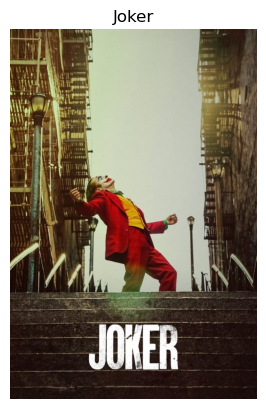

Recommendations



C:\Users\Lenovo\AppData\Local\Temp\ipykernel_7328\4097385030.py:44: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


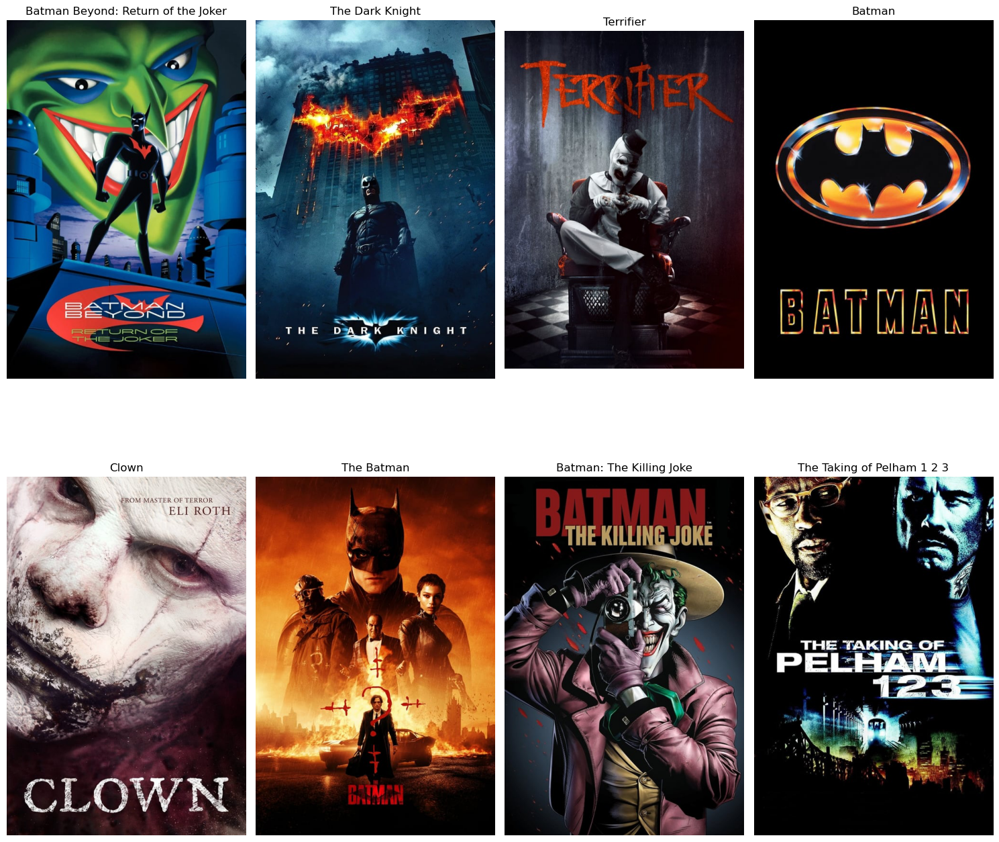

In [46]:
get_recommendations("Joker")


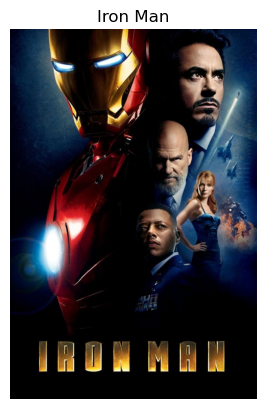

Recommendations



C:\Users\Lenovo\AppData\Local\Temp\ipykernel_7328\4097385030.py:44: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


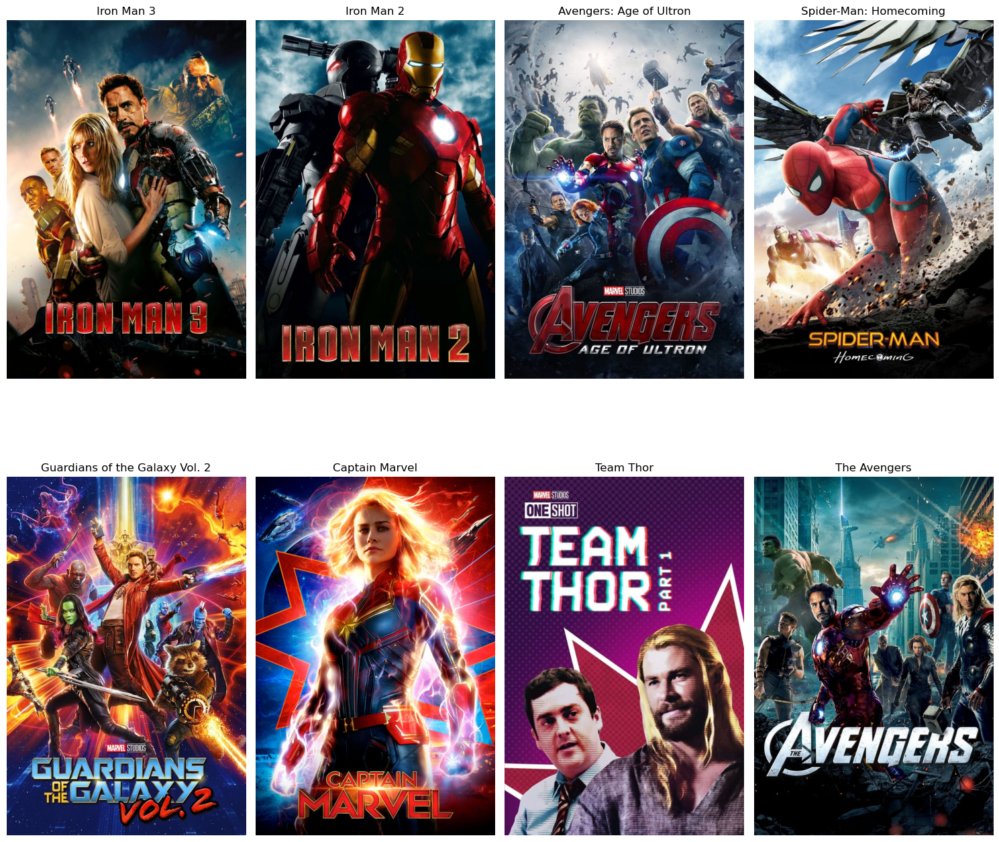

In [47]:
get_recommendations("Iron Man")


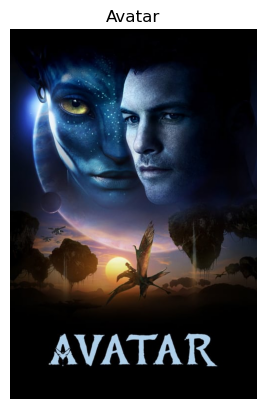

Recommendations



C:\Users\Lenovo\AppData\Local\Temp\ipykernel_7328\4097385030.py:44: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


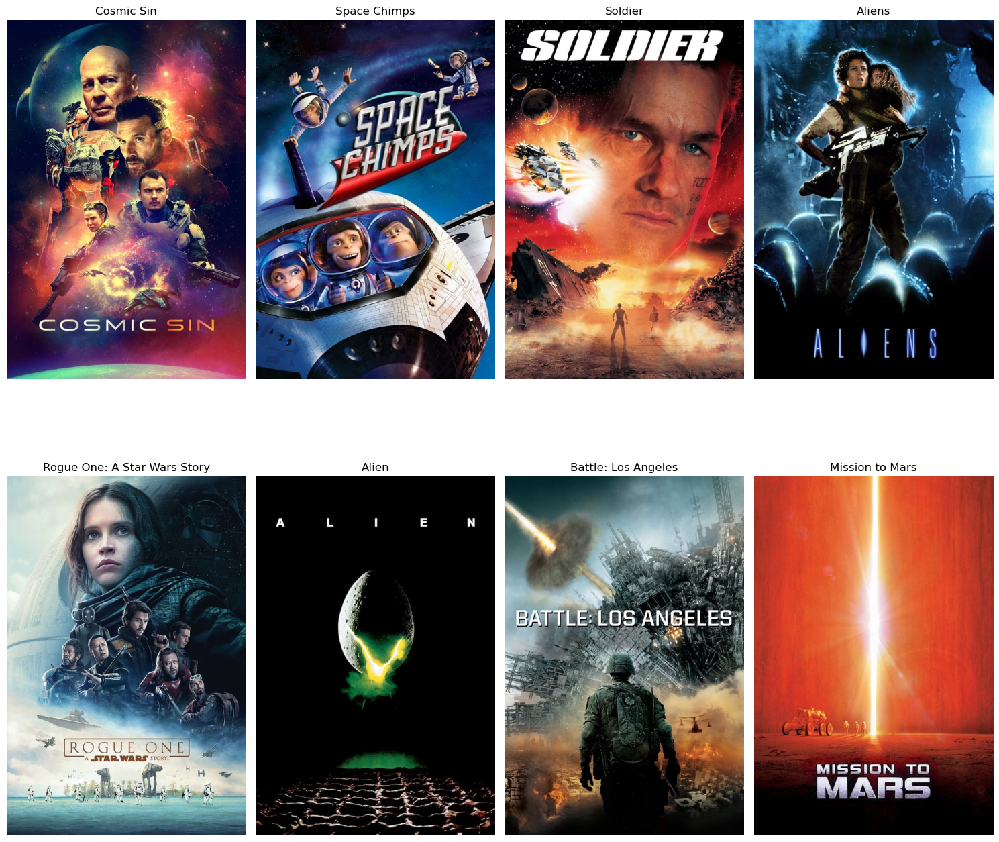

In [48]:
get_recommendations("Avatar")


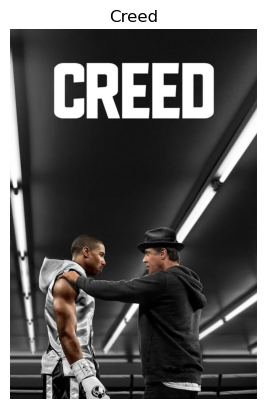

Recommendations



C:\Users\Lenovo\AppData\Local\Temp\ipykernel_7328\4097385030.py:44: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


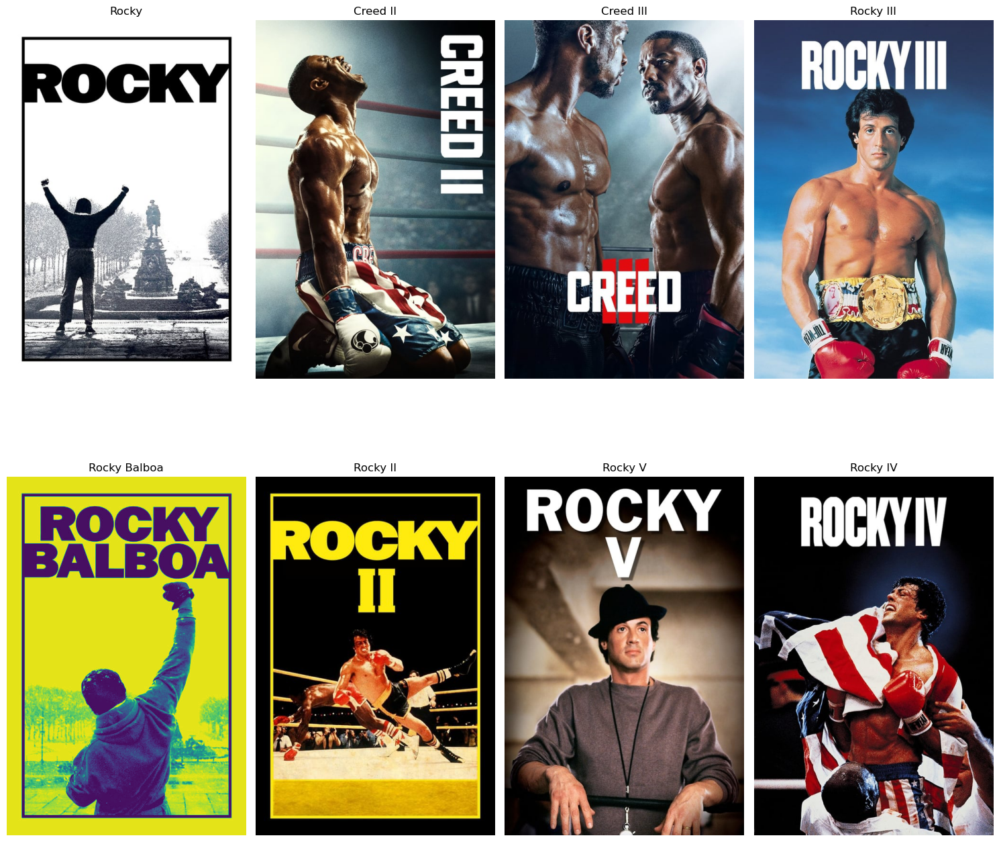

In [63]:
get_recommendations("Creed")
